# Project Assignment Winter Call, A.Y. 2023/2024

# (s316686, s319359)

In [1]:
%pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip install catboost-gpu

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement catboost-gpu (from versions: none)
ERROR: No matching distribution found for catboost-gpu


In [3]:
import pandas as pd
import numpy as np
from catboost import CatBoostRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.model_selection import KFold

import matplotlib.pyplot as plt


pd.set_option('display.max_rows', 100)

# 1. Define Task


---



The objective is to develop a data science pipeline for predicting the position of particle events in a Resistive Silicon Detector (RSD) used in particle physics. The RSD sensor, with a 2-dimensional surface, employs 12 snowflake-shaped metallic pads to measure signals when a particle passes through. Each event is characterized by signals from these pads, and the goal is to predict the corresponding (x, y) coordinates of the particle's passage on the sensor's surface. The project aims to establish a predictive model based on the signal characteristics from each pad for accurate localization of particle events in the RSD.

# 2. Acquire Clean Data

In [4]:
pd.set_option('display.max_rows', 100)

### Loading the dataset

In [5]:
data_path = 'C:/Users/fabri/Documents/_progetti/VisualStudioCodeProjects/datascience/development.csv'

df = pd.read_csv(data_path)

In [6]:
df_full = df.copy() #i will need it later to show the feature_importances_

In [7]:
df

,x,y,pmax[0],negpmax[0],area[0],tmax[0],rms[0],pmax[1],negpmax[1],area[1],...,pmax[16],negpmax[16],area[16],tmax[16],rms[16],pmax[17],negpmax[17],area[17],tmax[17],rms[17]
0,200.0,200.0,4.066907,-17.690173,2.847932,0.600000,2.007042,5.409161,-17.721210,4.538778,...,607.109118,-36.282996,583.899899,72.373094,0.374498,614.916861,-39.848523,591.852768,72.331028,0.405595
1,200.0,200.0,5.916801,-4.717111,5.792778,79.765174,1.564535,4.414289,-4.736827,3.720435,...,630.348007,-39.715988,580.042799,71.029155,0.403258,624.950701,-41.266681,586.569646,71.089058,0.405890
2,200.0,200.0,4.286652,-5.316132,2.356390,74.600000,1.404622,4.567191,-5.985437,3.490490,...,613.880342,-40.679678,580.407491,71.892264,0.568777,596.437125,-42.712286,574.091695,71.943934,0.498019
3,200.0,200.0,4.003635,-4.617459,2.189005,43.000000,1.512162,5.019058,-4.229949,6.786200,...,600.714957,-43.206601,579.882635,72.357388,0.255483,591.763739,-50.681940,584.099483,72.333282,0.336454
4,200.0,200.0,4.448146,-4.848743,3.997002,196.667482,1.101113,3.250262,-5.783587,2.449456,...,609.723785,-43.570892,590.156125,71.249130,0.413855,606.917023,-49.923819,584.316142,71.242904,0.293824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385495,600.0,595.0,5.051422,-3.872162,14.537390,32.000000,1.103550,49.819376,-26.266623,24.781403,...,581.954264,-39.634247,580.419676,71.167754,0.714250,614.629732,-47.182980,594.565758,71.359798,0.345872
385496,600.0,595.0,4.067664,-5.534358,2.011714,40.200000,1.895393,51.016495,-26.138474,27.090894,...,591.334030,-40.229095,589.105579,71.562414,0.325978,589.602095,-49.995053,588.799525,71.539605,0.318873
385497,600.0,595.0,4.243555,-5.801462,3.199481,150.891763,1.248541,46.661682,-30.943115,24.980347,...,619.698505,-46.600293,582.079851,71.420761,0.430833,610.999390,-43.620535,589.163170,71.569655,0.301635
385498,600.0,595.0,14.552444,-5.017258,6.367075,72.200000,1.215713,46.515765,-22.520367,33.163073,...,597.935632,-43.848615,589.201047,71.426835,0.474301,611.263138,-49.387009,587.916994,71.466307,0.408242


In [8]:
df.iloc[3]

x              200.000000
y              200.000000
pmax[0]          4.003635
negpmax[0]      -4.617459
area[0]          2.189005
tmax[0]         43.000000
rms[0]           1.512162
pmax[1]          5.019058
negpmax[1]      -4.229949
area[1]          6.786200
tmax[1]        175.600000
rms[1]           1.350620
pmax[2]          4.165598
negpmax[2]      -5.576041
area[2]          1.544370
tmax[2]         14.000000
rms[2]           1.115078
pmax[3]          3.791672
negpmax[3]      -4.981216
area[3]          2.985681
tmax[3]        104.000000
rms[3]           1.374108
pmax[4]          4.848719
negpmax[4]      -3.985501
area[4]          5.184150
tmax[4]        197.725932
rms[4]           1.849099
pmax[5]         10.422260
negpmax[5]      -4.916791
area[5]          5.480527
tmax[5]         72.400000
rms[5]           0.809550
pmax[6]          5.157927
negpmax[6]      -3.594675
area[6]          9.393185
tmax[6]         72.081513
rms[6]           1.633162
pmax[7]          2.999829
negpmax[7]  

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 385500 entries, 0 to 385499
Data columns (total 92 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   x            385500 non-null  float64
 1   y            385500 non-null  float64
 2   pmax[0]      385500 non-null  float64
 3   negpmax[0]   385500 non-null  float64
 4   area[0]      385500 non-null  float64
 5   tmax[0]      385500 non-null  float64
 6   rms[0]       385500 non-null  float64
 7   pmax[1]      385500 non-null  float64
 8   negpmax[1]   385500 non-null  float64
 9   area[1]      385500 non-null  float64
 10  tmax[1]      385500 non-null  float64
 11  rms[1]       385500 non-null  float64
 12  pmax[2]      385500 non-null  float64
 13  negpmax[2]   385500 non-null  float64
 14  area[2]      385500 non-null  float64
 15  tmax[2]      385500 non-null  float64
 16  rms[2]       385500 non-null  float64
 17  pmax[3]      385500 non-null  float64
 18  negpmax[3]   385500 non-

In [10]:
df.isna().any(axis=0)

x              False
y              False
pmax[0]        False
negpmax[0]     False
area[0]        False
tmax[0]        False
rms[0]         False
pmax[1]        False
negpmax[1]     False
area[1]        False
tmax[1]        False
rms[1]         False
pmax[2]        False
negpmax[2]     False
area[2]        False
tmax[2]        False
rms[2]         False
pmax[3]        False
negpmax[3]     False
area[3]        False
tmax[3]        False
rms[3]         False
pmax[4]        False
negpmax[4]     False
area[4]        False
tmax[4]        False
rms[4]         False
pmax[5]        False
negpmax[5]     False
area[5]        False
tmax[5]        False
rms[5]         False
pmax[6]        False
negpmax[6]     False
area[6]        False
tmax[6]        False
rms[6]         False
pmax[7]        False
negpmax[7]     False
area[7]        False
tmax[7]        False
rms[7]         False
pmax[8]        False
negpmax[8]     False
area[8]        False
tmax[8]        False
rms[8]         False
pmax[9]      

All the features do not hate any kind of missing values. Furthermore all the type of the values of all the features are **float64**. <br>
This can lead to few or even null actions in data preparation operations. <br >

Let's see if maybe some duplicates are present :

In [11]:
duplicate_rows = df.duplicated()
if True in duplicate_rows.values:
  print('This dataset got some duplicates, lets fix it!')
else :
  print('This dataset is even free from duplicates, go ahead!')

This dataset is even free from duplicates, go ahead!


In [12]:
df['x'].unique().shape, df['y'].unique().shape

((81,), (81,))

The dataset has 81 x and y possibile positions available for the events.

# 3. Understand & Prepare Data

## Noisy Features

By mapping the magnitude of the positive peak of the signal **pmax** for each pad available in the features (which are 12 real pad + 6 fake), we can easily identify which ones are likely to disturb our analysis.

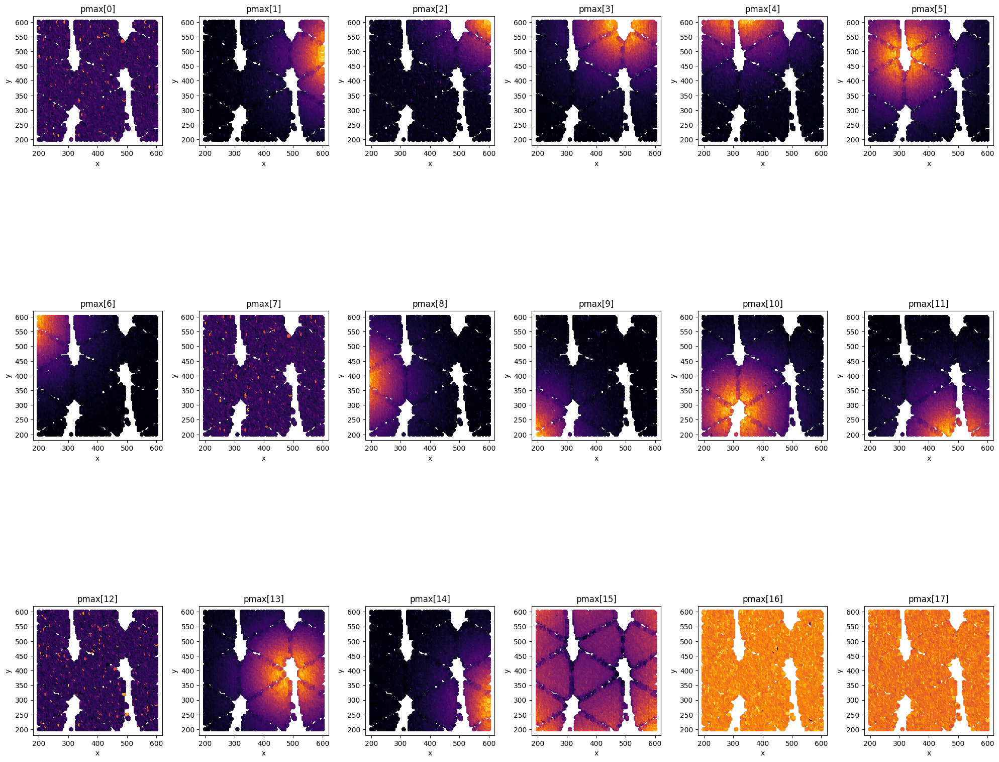

In [13]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(20, 20), subplot_kw={'aspect': 'equal'})  # Adjust the figsize as needed for square subplots

# Plot scatter plots in the first 18 subplots
for i in range(18):
    row_index = i // 6
    col_index = i % 6

    df.plot.scatter(x='x', y='y', s=None, c=df[f'pmax[{i}]'], cmap='inferno', colorbar=False, ax=axes[row_index, col_index])
    axes[row_index, col_index].set_title(f'pmax[{i}]')

# Delete the remaining subplots
for i in range(18, 3 * 6):
    row_index = i // 6
    col_index = i % 6
    fig.delaxes(axes[row_index, col_index])

plt.subplots_adjust(hspace=0.001)  # Adjust the hspace value as needed

plt.tight_layout()
plt.show()



As we see, the features of 'pads' : <br>
> **[0-7-12-15-16-17]**  <br>

are to be ignored and will therefore be eliminated. <br>
I would like to point out that except for the 15th 'pad,' all the other noisy pads are quite homogeneous in terms of the distribution of the magnitude of the peak pmax. <br>


Let's now drop the noisy features (we can call them 'fake' pads)

In [14]:
noisey_numbers = [0,7,12,15,16,17]
measurement = ['pmax','negpmax','tmax','area','rms']
features=[]

for i in noisey_numbers:
  for measure in measurement:
   features.append(f'{measure}[{i}]')

df_full_cleaned = df_full.drop(features, axis = 1)

# cleaned  = without fake pads
# full = with all the measures (area,tmax,rms)

In [15]:
real_pads = [1,2,3,4,5,6,8,9,10,11,13,14]

## Pads Mapping

Our goal is to understand the spatial arrangement of the 12 pads.

We will use the following algorithm:

1. **for** each pad $i$:
    1. **while** *n_samples* < $50$ :
        1. Compute the top value of *pmax*$[i]$ and find the corresponding row-index $j$.
        1. Obtain the coordinates ($x_j$,$y_j$).
        1. Append the coordinates ($x_j$,$y_j$) to $xcollector_i$.
        1. Delete the row with index $j$.
    1. Compute the average of $xcollector_i$ to get the coordinates ($x_i$,$y_i$).
2. **return** _pads_location_


In [16]:
df_copy = df.copy()

# initializing the dictionary
pads_location = {
    1: (0, 0),
    2: (0, 0),
    3: (0, 0),
    4: (0, 0),
    5: (0, 0),
    6: (0, 0),
    8: (0, 0),
    9: (0, 0),
    10: (0, 0),
    11: (0, 0),
    13: (0, 0),
    14: (0, 0),
}

for i in real_pads:
    x_collector = np.array([])
    y_collector = np.array([])

    samples = 0
    while samples < 50 :
        # resetting the index everytime in order to avoid index errors
        df_copy.reset_index(drop=True, inplace=True)

        j = df_copy[f'pmax[{i}]'].idxmax()
        x_i = df_copy.iloc[j]['x']
        y_i = df_copy.iloc[j]['y']

        x_collector = np.append(x_collector, x_i)
        y_collector = np.append(y_collector, y_i)

        df_copy = df_copy.drop(j)
        samples += 1

    x_pad = x_collector.mean()
    y_pad = y_collector.mean()
    pads_location[i] = (x_pad, y_pad)

In [17]:
pads_location

{1: (599.7, 486.8),
 2: (595.9, 597.0),
 3: (464.8, 588.6),
 4: (341.9, 599.5),
 5: (308.9, 492.3),
 6: (201.1, 589.2),
 8: (200.6, 388.3),
 9: (203.6, 201.6),
 10: (318.6, 282.6),
 11: (466.8, 210.8),
 13: (478.5, 371.2),
 14: (599.7, 281.2)}

These should be the coordinates of the 12 pads. They will not be 100% exact as not all measurements are maximum at those points. But to get an idea of the distribution of the pads is more than enough.

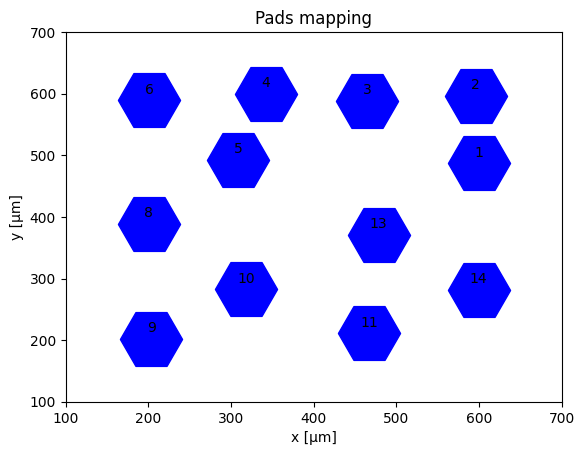

In [18]:
x_coords, y_coords = zip(*pads_location.values())

fig, ax = plt.subplots()
ax.scatter(x_coords, y_coords, marker='H', s=2000, color='blue')

for pad, (x, y) in pads_location.items():
    ax.annotate(str(pad), (x, y), textcoords="offset points", xytext=(0, 5), ha='center')

mu_symbol = '\u03BC'

ax.set_xlabel(f'x [{mu_symbol}m]')
ax.set_ylabel(f'y [{mu_symbol}m]')
ax.set_title('Pads mapping')
ax.set_xlim([100, 700])
ax.set_ylim([100, 700])

plt.grid(False)
plt.show()


We can start by defining, for each pad, the neighbouring pads :


In [19]:
neighborhood_dict = {
    1: [2, 3, 13, 14],
    2: [1, 3],
    3: [1, 2, 4, 5, 13],
    4: [3, 5, 6],
    5: [3, 4, 6, 8, 10, 13],
    6: [4, 5, 8],
    8: [6, 5, 10, 9],
    9: [8, 10],
    10: [9, 8, 5, 13, 11],
    11: [10, 13, 14],
    13: [1, 3, 5, 10, 11, 14],
    14: [1, 13, 11]
}

We will call each neighboor $ n $, where $ n \in \mathbb{N}_i $ is the set of the whole neighborhood for the pad $i$.


In order to create new features that can help us later on, we want to check the level of $pmax$ around the peak pad of each event and call it the $p$ pad. <bR> We then check that for each $pmax_p$ (which would then be the pad $p$ reading the maximum value of an event), all $ n \in \mathbb{N}_p $ neighbouring pads have a value that exceeds a certain threshold: <br> <br>
$$pmax_{n,p}> treshold$$ <br>
where $pmax_{n,p}$ is the value that , a neighbor pad $n$ of the pad $p$, reads. <br>
We noticed than, by sampling 10.000 events for each pad $p$ where the reading $pmax_p$ was maximum, that each neighbor pad $n$ has : <br> <br>  $$pmax_{n,p} > 19 mV$$

In [22]:
for i in real_pads:
  pmax_itself = df_full_cleaned.loc[df_full_cleaned[f'pmax[{i}]'].nlargest(10000).index]['pmax[8]'].mean()
  print(f'Pad{i} system : ')
  print('***********************************')
  for j in real_pads:
      mean_value = df_full_cleaned.loc[df_full_cleaned[f'pmax[{i}]'].nlargest(10000).index][f'pmax[{j}]'].mean()
      if mean_value > 19 and j in neighborhood_dict[i]:
        print(f'pad{j} : {mean_value} --> OK!')
      else :
        print(f'pad{j} : {mean_value}')
  print()

NameError: name 'df_cleaned' is not defined

As you can see this assumption is true!
All the neighbor pads $n$ has a value > 19 mV.

To summarise, we are trying to create new features that indicate the pad $p$ where $pmax[p]$ of the event is maximum , and consequently all adjacent $ n \in \mathbb{N}_p $ pads as well. This can subsequently lead to better 'μ geo-localisation'.  by drawing an imaginary area and narrowing the field.

The new features will be called : <br>
- $pad_1$
- $pad_2$
- $pad_3$
- $pad_4$
- $pad_5$
- $pad_6$
- $pad_8$
- $pad_9$
- $pad_{10}$
- $pad_{11}$
- $pad_{13}$
- $pad_{14}$
<br><br>
and  <br>

$$ pad[i] =\
\begin{cases}
    10  & \text{if pad = p} \\
    1 & \text{if pad = n} \\
    0 & \text{else }
\end{cases} $$ <br> <br>

Example with $p = 3$ :

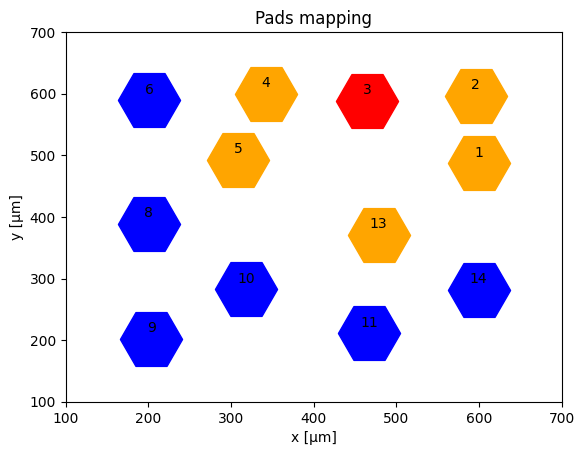

In [ ]:
# @title
fig, ax = plt.subplots()

# p = 3, example:
p = 3

for pad, (x, y) in pads_location.items():
    if pad == p:
        ax.scatter(x, y, marker='H', s=2000, color='red')
    elif pad in neighborhood_dict.get(p, []):
        ax.scatter(x, y, marker='H', s=2000, color='orange')
    else:
        ax.scatter(x, y, marker='H', s=2000, color='blue')

for pad, (x, y) in pads_location.items():
    ax.annotate(str(pad), (x, y), textcoords="offset points", xytext=(0, 5), ha='center')

mu_symbol = '\u03BC'

ax.set_xlabel(f'x [{mu_symbol}m]')
ax.set_ylabel(f'y [{mu_symbol}m]')
ax.set_title('Pads mapping')
ax.set_xlim([100, 700])
ax.set_ylim([100, 700])

plt.grid(False)
plt.show()

Example with $p = 10$ :

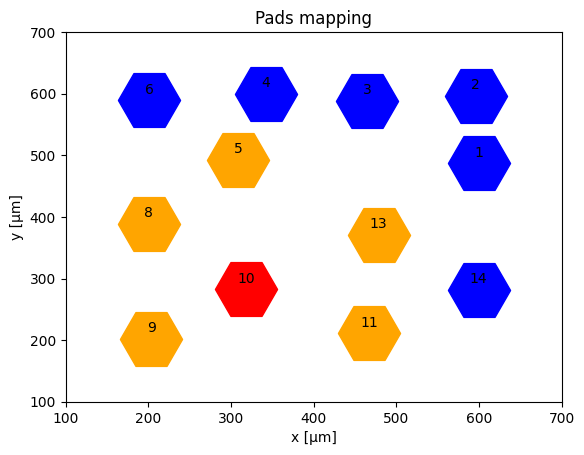

In [ ]:
# @title
fig, ax = plt.subplots()

p = 10

for pad, (x, y) in pads_location.items():
    if pad == p:
        ax.scatter(x, y, marker='H', s=2000, color='red')
    elif pad in neighborhood_dict.get(p, []):
        ax.scatter(x, y, marker='H', s=2000, color='orange')
    else:
        ax.scatter(x, y, marker='H', s=2000, color='blue')

for pad, (x, y) in pads_location.items():
    ax.annotate(str(pad), (x, y), textcoords="offset points", xytext=(0, 5), ha='center')

mu_symbol = '\u03BC'

ax.set_xlabel(f'x [{mu_symbol}m]')
ax.set_ylabel(f'y [{mu_symbol}m]')
ax.set_title('Pads mapping')
ax.set_xlim([100, 700])
ax.set_ylim([100, 700])

plt.grid(False)
plt.show()

In [ ]:
def pad_localization(row):
    max_pad = real_pads[0]  # initialize with the first pad
    max_value = row[f'pmax[{real_pads[0]}]']

    for pad in real_pads[1:]:
        if row[f'pmax[{pad}]'] > max_value:
            max_value = row[f'pmax[{pad}]']
            max_pad = pad

    # initialize a list for the new feature columns
    feature_columns = [0] * len(real_pads)

    # set value 10 for the maximum pad
    feature_columns[real_pads.index(max_pad)] = 10

    # set value 1 for the neighborhood pads
    for neighbor_pad in neighborhood_dict.get(max_pad, []):
        if neighbor_pad in real_pads:
            feature_columns[real_pads.index(neighbor_pad)] = 1

    return pd.Series(feature_columns, index=[f'pad_{pad}' for pad in real_pads])

 # apply the feature engineering function to each row
new_columns = df_full_cleaned.apply(pad_localization, axis=1)

df_full_cleaned = pd.concat([df_full_cleaned, new_columns], axis=1)

df_full_cleaned

,x,y,pmax[1],negpmax[1],area[1],tmax[1],rms[1],pmax[2],negpmax[2],area[2],...,pad_3,pad_4,pad_5,pad_6,pad_8,pad_9,pad_10,pad_11,pad_13,pad_14
0,200.0,200.0,5.409161,-17.721210,4.538778,22.600000,1.563902,6.084506,-19.892543,3.132328,...,0,0,0,0,1,10,1,0,0,0
1,200.0,200.0,4.414289,-4.736827,3.720435,111.875058,1.228058,4.507257,-3.787175,3.267461,...,0,0,0,0,1,10,1,0,0,0
2,200.0,200.0,4.567191,-5.985437,3.490490,107.800000,1.015408,5.384155,-3.948853,2.929150,...,0,0,0,0,1,10,1,0,0,0
3,200.0,200.0,5.019058,-4.229949,6.786200,175.600000,1.350620,4.165598,-5.576041,1.544370,...,0,0,0,0,1,10,1,0,0,0
4,200.0,200.0,3.250262,-5.783587,2.449456,159.800000,0.759515,4.736023,-5.137939,4.211047,...,0,0,0,0,1,10,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385495,600.0,595.0,49.819376,-26.266623,24.781403,71.000000,1.021450,55.651440,-29.947864,28.621582,...,10,1,1,0,0,0,0,0,1,0
385496,600.0,595.0,51.016495,-26.138474,27.090894,71.400000,1.570939,58.084024,-34.662131,28.435582,...,10,1,1,0,0,0,0,0,1,0
385497,600.0,595.0,46.661682,-30.943115,24.980347,71.200000,1.255832,61.840103,-35.670273,30.500351,...,10,1,1,0,0,0,0,0,1,0
385498,600.0,595.0,46.515765,-22.520367,33.163073,71.400000,1.465443,49.772070,-33.298181,27.110076,...,10,1,1,0,0,0,0,0,1,0


# 4. Build the Model

Let's divide the dataset between features and labels :

In [ ]:
X = df_full_cleaned.drop(['x', 'y'], axis=1).values
y = df_full_cleaned[['x','y']].values # one output is enough to understand the features_importance

In [ ]:
X

array([[  5.40916138, -17.72120972,   4.53877808, ...,   0.        ,
          0.        ,   0.        ],
       [  4.41428904,  -4.73682692,   3.72043457, ...,   0.        ,
          0.        ,   0.        ],
       [  4.56719055,  -5.98543721,   3.49049011, ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [ 46.66168213, -30.94311523,  24.98034668, ...,   0.        ,
          1.        ,   0.        ],
       [ 46.51576538, -22.52036743,  33.16307251, ...,   0.        ,
          1.        ,   0.        ],
       [ 53.98814697, -26.61689453,  31.2947168 , ...,   0.        ,
          1.        ,   0.        ]])

## CatBoost

The **DecisionTree** seemed to us to be the tailor-made model for this type of problem. Unfortunately, however, its performance did not get us over the threshold of the score to pass. <br>
The most intuitive solution is therefore to use the **RandomForest**. The problem with the latter, however, is, given the number of data and features, that it is too slow. <br> <br>
Staying with the regression due to the decision tree, we found a really convenient middle way: **CatBoost**. <br>
This model allows us to create several **DecisionTrees** by optimising the choice of nodes each time (thus decreasing the error) via _**gradient boosting**_. <br> <br>

We have omitted the various pattern selection attempts (DecisionTree & RandomForest) so as not to bore the reader and unnecessarily lengthen the notebook.

*********************************************************

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
y_train_x = y_train[:,0]
y_train_y = y_train[:,1]

y_test_x = y_test[:,0]
y_test_y = y_test[:,1]

This datascience pipeline will predict 2 values : **(x,y)** <br><br>
Since the two variables are dependent (depending on where the event is located, $x$ will follow $y$ and vice versa), we decided to perform the training only on one output (which would be $x$). The hyperparameters and parameters that the model will find, will also be suitable for finding output $y$. This choice allows us to save time during the grid search and consequently increase our search space to find a better configuration for the same amount of time! The steps we will apply are : <br>


    > Grid Search for label x:
        Perform a grid search using your training data and the x-label as the target variable. Find the best hyperparameters for predicting x.

    > Apply Best Parameters to label y:
        Use the best hyperparameters obtained from the grid search for predicting x and apply them to train a model for predicting y.

Let's initialize the model :

In [ ]:
catboost = CatBoostRegressor(loss_function='RMSE', random_seed=42, task_type='GPU') #multioutput already integrated

The score that we must use is :

In [ ]:
def euclidean_distance(y_true, y_pred):
    xx_test = y_true[:, 0]
    yy_test = y_true[:, 1]

    xx_pred = y_pred[:, 0]
    yy_pred = y_pred[:, 1]

    n = y_true.shape[0]

    denominator = n
    numerator = np.sqrt(np.sum((xx_test - xx_pred)**2 + (yy_test - yy_pred)**2))

    return numerator / denominator

### GRIDSEARCH

In [ ]:
#******************************** grid_search ***********************************************

param_grid = {
    'learning_rate': [0.15,0.2,0.25],
    'depth': [8],
    'iterations': [1300,1500]
    }

grid_search = GridSearchCV(estimator=catboost, param_grid=param_grid, cv=5, verbose=1, error_score='raise')

grid_search.fit(X_train, y_train_x)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
0:	learn: 103.3855494	total: 47.6ms	remaining: 1m 1s
1:	learn: 88.7393540	total: 69.7ms	remaining: 45.2s
2:	learn: 76.2405996	total: 89.1ms	remaining: 38.5s
3:	learn: 65.6112544	total: 109ms	remaining: 35.5s
4:	learn: 56.5610592	total: 130ms	remaining: 33.6s
5:	learn: 49.0484786	total: 150ms	remaining: 32.3s
6:	learn: 42.5039093	total: 170ms	remaining: 31.3s
7:	learn: 37.0451599	total: 189ms	remaining: 30.6s
8:	learn: 32.3086609	total: 209ms	remaining: 30s
9:	learn: 28.3190812	total: 228ms	remaining: 29.4s
10:	learn: 24.9353175	total: 248ms	remaining: 29s
11:	learn: 22.1475856	total: 268ms	remaining: 28.7s
12:	learn: 19.8157756	total: 287ms	remaining: 28.5s
13:	learn: 17.8667797	total: 307ms	remaining: 28.2s
14:	learn: 16.2824636	total: 327ms	remaining: 28s
15:	learn: 14.9926354	total: 347ms	remaining: 27.9s
16:	learn: 13.9217521	total: 367ms	remaining: 27.7s
17:	learn: 13.0382208	total: 386ms	remaining: 27.5s
18:	learn: 12.31

GridSearchCV(cv=5, error_score='raise',
             estimator=<catboost.core.CatBoostRegressor object at 0x000002873CF6ED40>,
             param_grid={'depth': [8], 'iterations': [1300, 1500],
                         'learning_rate': [0.15, 0.2, 0.25]},
             verbose=1)

In [ ]:
best_params_grid = grid_search.best_params_
best_params_grid

{'depth': 8, 'iterations': 1500, 'learning_rate': 0.15}

In [ ]:
best_model_grid = grid_search.best_estimator_
y_pred_x = best_model_grid.predict(X_test)

In [ ]:
best_model_grid.fit(X_train,y_train_y)
y_pred_y = best_model_grid.predict(X_test)

0:	learn: 97.5354791	total: 46.1ms	remaining: 1m 9s
1:	learn: 83.9226129	total: 68.8ms	remaining: 51.5s
2:	learn: 72.2352279	total: 92.5ms	remaining: 46.2s
3:	learn: 62.3271472	total: 116ms	remaining: 43.3s
4:	learn: 53.8557223	total: 139ms	remaining: 41.6s
5:	learn: 46.6524908	total: 162ms	remaining: 40.3s
6:	learn: 40.5361485	total: 186ms	remaining: 39.6s
7:	learn: 35.3939687	total: 208ms	remaining: 38.8s
8:	learn: 30.9865419	total: 231ms	remaining: 38.3s
9:	learn: 27.2736895	total: 255ms	remaining: 38.1s
10:	learn: 24.1638359	total: 278ms	remaining: 37.7s
11:	learn: 21.5646354	total: 304ms	remaining: 37.7s
12:	learn: 19.4267020	total: 328ms	remaining: 37.5s
13:	learn: 17.6411799	total: 355ms	remaining: 37.7s
14:	learn: 16.1242584	total: 379ms	remaining: 37.6s
15:	learn: 14.8828141	total: 400ms	remaining: 37.1s
16:	learn: 13.8208166	total: 422ms	remaining: 36.8s
17:	learn: 12.9330903	total: 445ms	remaining: 36.6s
18:	learn: 12.2325959	total: 467ms	remaining: 36.4s
19:	learn: 11.61066

In [ ]:
y_pred = pd.DataFrame({'x': y_pred_x, 'y': y_pred_y})

In [ ]:
score_grid = euclidean_distance(y_test, y_pred.values)
print(f"Euclidean Distance {score_grid}")

Euclidean Distance 0.01863217783798813


### RANDOMSEARCH

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'learning_rate': [0.075 ,0.1, 0.15, 0.175, 0.2, 0.225, 0.25, 0.3],
    'depth': [8, 10],
    'iterations': [1150,1300,1500,1700,1900],  # Add other hyperparameters as needed
}

random_search = RandomizedSearchCV(
    estimator=catboost,
    param_distributions=param_dist,
    n_iter=15,
    cv=5,
    verbose=1,
    error_score='raise',
    random_state=42,
)

random_search.fit(X_train, y_train_x)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
0:	learn: 92.0161774	total: 57.1ms	remaining: 1m 37s
1:	learn: 70.6045169	total: 79ms	remaining: 1m 7s
2:	learn: 54.6950134	total: 100ms	remaining: 56.5s
3:	learn: 42.5828052	total: 120ms	remaining: 51s
4:	learn: 33.3747172	total: 140ms	remaining: 47.4s
5:	learn: 26.7770096	total: 159ms	remaining: 44.9s
6:	learn: 21.8366212	total: 178ms	remaining: 43.2s
7:	learn: 18.5272979	total: 197ms	remaining: 41.7s
8:	learn: 16.0649606	total: 217ms	remaining: 40.7s
9:	learn: 14.3671897	total: 237ms	remaining: 40s
10:	learn: 13.0726200	total: 255ms	remaining: 39.1s
11:	learn: 12.1425093	total: 274ms	remaining: 38.5s
12:	learn: 11.5304606	total: 292ms	remaining: 37.9s
13:	learn: 11.0866198	total: 311ms	remaining: 37.5s
14:	learn: 10.5750456	total: 332ms	remaining: 37.2s
15:	learn: 10.2124222	total: 352ms	remaining: 37s
16:	learn: 9.9171741	total: 371ms	remaining: 36.8s
17:	learn: 9.7100888	total: 389ms	remaining: 36.3s
18:	learn: 9.4627389

RandomizedSearchCV(cv=5, error_score='raise',
                   estimator=<catboost.core.CatBoostRegressor object at 0x000002873CF6ED40>,
                   n_iter=15,
                   param_distributions={'depth': [8, 10],
                                        'iterations': [1150, 1300, 1500, 1700,
                                                       1900],
                                        'learning_rate': [0.075, 0.1, 0.15,
                                                          0.175, 0.2, 0.225,
                                                          0.25, 0.3]},
                   random_state=42, verbose=1)

In [ ]:
best_params_random = random_search.best_params_
best_params_random

{'learning_rate': 0.1, 'iterations': 1900, 'depth': 8}

In [ ]:
best_model_random = random_search.best_estimator_
y_pred_x = best_model_random.predict(X_test)

In [ ]:
best_model_random.fit(X_train,y_train_y)
y_pred_y = best_model_random.predict(X_test)

0:	learn: 102.8520027	total: 73.2ms	remaining: 2m 19s
1:	learn: 93.2045973	total: 96ms	remaining: 1m 31s
2:	learn: 84.4963617	total: 120ms	remaining: 1m 15s
3:	learn: 76.6537679	total: 142ms	remaining: 1m 7s
4:	learn: 69.5642807	total: 165ms	remaining: 1m 2s
5:	learn: 63.1677758	total: 188ms	remaining: 59.3s
6:	learn: 57.3895675	total: 211ms	remaining: 57s
7:	learn: 52.1867028	total: 235ms	remaining: 55.5s
8:	learn: 47.5063825	total: 257ms	remaining: 54s
9:	learn: 43.2956608	total: 280ms	remaining: 52.9s
10:	learn: 39.5404018	total: 303ms	remaining: 52.1s
11:	learn: 36.1694963	total: 327ms	remaining: 51.4s
12:	learn: 33.1242880	total: 349ms	remaining: 50.7s
13:	learn: 30.3790164	total: 371ms	remaining: 50s
14:	learn: 27.9282373	total: 394ms	remaining: 49.5s
15:	learn: 25.7353132	total: 418ms	remaining: 49.2s
16:	learn: 23.7796494	total: 441ms	remaining: 48.8s
17:	learn: 22.0508405	total: 463ms	remaining: 48.4s
18:	learn: 20.5138405	total: 486ms	remaining: 48.1s
19:	learn: 19.1044850	to

In [ ]:
y_pred = pd.DataFrame({'x': y_pred_x, 'y': y_pred_y})

In [ ]:
score_random = euclidean_distance(y_test, y_pred.values)
print(f"Euclidean Distance {score_random}")

Euclidean Distance 0.01848021287299331


### GRID VS RANDOM

In [ ]:
if score_grid < score_random :
  best_model = best_model_grid
  print('The best hyperparameter tuned model is done with the GridSearch')
else :
  best_model = best_model_random
  print('The best hyperparameter tuned model is done with the RandomSearch')

The best hyperparameter tuned model is done with the RandomSearch


## Evaluation

In [ ]:
evaluation_event = 'C:/Users/fabri/Documents/_progetti/VisualStudioCodeProjects/datascience/evaluation.csv'

In [ ]:
df_eval = pd.read_csv(evaluation_event)

In [ ]:
noisey_numbers = [0,7,12,15,16,17]
measurement = ['pmax','negpmax','area','tmax','rms']

features=[]

for i in noisey_numbers:
  for measure in measurement:
   features.append(f'{measure}[{i}]')

df_cleaned_eval = df_eval.drop(features, axis = 1)
df_cleaned_eval

,Id,pmax[1],negpmax[1],area[1],tmax[1],rms[1],pmax[2],negpmax[2],area[2],tmax[2],...,pmax[13],negpmax[13],area[13],tmax[13],rms[13],pmax[14],negpmax[14],area[14],tmax[14],rms[14]
0,0,8.738040,-3.598874,5.554105,70.800000,0.729175,5.359271,-4.603192,3.547230,179.800000,...,61.340985,-47.161761,28.716632,70.600000,0.775649,17.802664,-5.761484,8.623282,70.400000,1.150677
1,1,23.460358,-20.616669,17.998419,72.800000,1.258335,20.116995,-20.351328,11.315171,72.800000,...,23.587567,-10.732013,14.635765,72.800000,2.101599,10.272607,-6.347998,6.507688,72.800000,2.503477
2,2,4.837952,-7.224267,3.289124,67.057395,0.793541,6.132150,-4.086172,3.578799,38.800000,...,12.934276,-4.244329,11.301154,71.486437,0.938702,3.556735,-5.449399,3.488582,104.632916,1.042146
3,3,87.293692,-45.786813,38.422989,71.800000,0.733773,25.325571,-14.530936,10.306552,72.000000,...,43.858466,-18.916254,22.661873,72.000000,1.647570,16.255322,-9.080371,9.713149,71.800000,0.915295
4,4,9.593125,-5.374179,7.767408,72.414459,1.572473,6.618451,-4.427225,3.765579,72.400000,...,54.800885,-23.237872,32.614696,72.000000,1.258360,10.197021,-7.442810,7.130603,72.000000,1.256862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128495,128495,9.327438,-3.704605,6.657654,71.400000,0.891158,4.763165,-4.856036,11.514778,49.200000,...,54.351236,-27.172751,26.922277,71.400000,1.085946,22.433310,-9.949075,13.170802,71.200000,1.747292
128496,128496,5.833882,-6.185739,4.184656,20.037256,1.422575,3.790421,-5.154848,4.475711,178.800000,...,15.090143,-6.553778,8.782450,71.600000,1.425143,4.467065,-4.729529,2.264683,84.400000,1.617628
128497,128497,19.402353,-8.160696,11.304202,70.800000,1.370319,17.555460,-8.818259,9.256798,70.600000,...,23.518393,-9.069559,13.958058,70.800000,1.625532,4.901157,-4.210786,2.049936,66.800000,0.908640
128498,128498,4.200095,-5.312485,2.652198,71.400000,0.932871,2.959903,-4.739268,0.946364,80.200000,...,14.752425,-5.178433,9.768462,71.425166,2.192589,11.362302,-6.197583,5.001778,94.800000,0.739196


In [ ]:
X_eval = df_cleaned_eval.drop(['Id'], axis = 1)
id_eval = df_cleaned_eval['Id']

In [ ]:
new_columns = X_eval.apply(pad_localization, axis=1)

# let's concatenate the new columns to the original DataFrame
X_eval = pd.concat([X_eval, new_columns], axis=1)

In [ ]:
best_model.fit(X,y[:,0])
y_eval_x = best_model.predict(X_eval)

0:	learn: 109.0540127	total: 63ms	remaining: 1m 59s
1:	learn: 98.6853494	total: 90.1ms	remaining: 1m 25s
2:	learn: 89.3478370	total: 112ms	remaining: 1m 10s
3:	learn: 80.9456639	total: 138ms	remaining: 1m 5s
4:	learn: 73.3542027	total: 162ms	remaining: 1m 1s
5:	learn: 66.5124927	total: 187ms	remaining: 59s
6:	learn: 60.4476683	total: 211ms	remaining: 57.1s
7:	learn: 54.8880723	total: 234ms	remaining: 55.2s
8:	learn: 49.9289570	total: 259ms	remaining: 54.3s
9:	learn: 45.4942626	total: 282ms	remaining: 53.3s
10:	learn: 41.4656750	total: 305ms	remaining: 52.4s
11:	learn: 37.9089754	total: 330ms	remaining: 51.9s
12:	learn: 34.6208138	total: 354ms	remaining: 51.4s
13:	learn: 31.6810300	total: 376ms	remaining: 50.7s
14:	learn: 29.0732157	total: 398ms	remaining: 50s
15:	learn: 26.7289819	total: 419ms	remaining: 49.3s
16:	learn: 24.6197583	total: 445ms	remaining: 49.3s
17:	learn: 22.7356681	total: 469ms	remaining: 49.1s
18:	learn: 21.0639431	total: 495ms	remaining: 49s
19:	learn: 19.6084458	to

In [ ]:
best_model.fit(X,y[:,1])
y_eval_y = best_model.predict(X_eval)

0:	learn: 102.8974207	total: 59.4ms	remaining: 1m 52s
1:	learn: 93.2213762	total: 85.8ms	remaining: 1m 21s
2:	learn: 84.5108830	total: 112ms	remaining: 1m 10s
3:	learn: 76.6413204	total: 137ms	remaining: 1m 4s
4:	learn: 69.5571330	total: 162ms	remaining: 1m 1s
5:	learn: 63.2055857	total: 188ms	remaining: 59.2s
6:	learn: 57.4179718	total: 214ms	remaining: 57.7s
7:	learn: 52.2154227	total: 240ms	remaining: 56.7s
8:	learn: 47.5652698	total: 264ms	remaining: 55.4s
9:	learn: 43.4122044	total: 289ms	remaining: 54.6s
10:	learn: 39.6476342	total: 315ms	remaining: 54.1s
11:	learn: 36.2485425	total: 341ms	remaining: 53.7s
12:	learn: 33.2238379	total: 366ms	remaining: 53.1s
13:	learn: 30.4775429	total: 390ms	remaining: 52.6s
14:	learn: 28.0359099	total: 415ms	remaining: 52.1s
15:	learn: 25.8411846	total: 440ms	remaining: 51.8s
16:	learn: 23.8938903	total: 466ms	remaining: 51.6s
17:	learn: 22.1493935	total: 490ms	remaining: 51.2s
18:	learn: 20.6005140	total: 516ms	remaining: 51s
19:	learn: 19.2059

In [ ]:
import pandas as pd

df_final = pd.DataFrame({'Id': id_eval, 'Predicted': [f'{x}|{y}' for x, y in zip(y_eval_x, y_eval_y)]})

excel_file_path = 'C:/Users/fabri/Documents/_progetti/VisualStudioCodeProjects/datascience/CHECK/12out.csv'

df_final.to_csv(excel_file_path, index=False, encoding='utf-8')

print(f"Combined predictions saved to {excel_file_path}")

Combined predictions saved to C:/Users/fabri/Documents/_progetti/VisualStudioCodeProjects/datascience/CHECK/12out.csv
